# Capstone Project
# Uber Fares Prediction Model with Streamlit

### Libraries

In [6]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Loading The Data

In [7]:
# Copying the file path and loading the data using pandas
file_path = '../CAPSTONE/uber.csv'
df = pd.read_csv(file_path)

## Exploratory Data Analysis + Data Cleaning

In [8]:
# Displaying top 5 rows
df.head()

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5


In [9]:
# Drop 'Unnamed: 0' column
df = df.drop('Unnamed: 0', axis=1)

In [10]:
# Convert pickup_datetime to datetime
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])

In [11]:
# Checking for null values
df.isnull().sum()

key                  0
fare_amount          0
pickup_datetime      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    1
dropoff_latitude     1
passenger_count      0
dtype: int64

In [12]:
df.dropna(inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 199999 entries, 0 to 199999
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                199999 non-null  object             
 1   fare_amount        199999 non-null  float64            
 2   pickup_datetime    199999 non-null  datetime64[ns, UTC]
 3   pickup_longitude   199999 non-null  float64            
 4   pickup_latitude    199999 non-null  float64            
 5   dropoff_longitude  199999 non-null  float64            
 6   dropoff_latitude   199999 non-null  float64            
 7   passenger_count    199999 non-null  int64              
dtypes: datetime64[ns, UTC](1), float64(5), int64(1), object(1)
memory usage: 13.7+ MB


In [14]:
# Checking for duplicates
df.duplicated().sum()

np.int64(0)

In [15]:
# Checking statistics
df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,199999.000000,199999.000000,199999.000000,199999.000000,199999.000000,199999.000000
mean,11.359892,-72.527631,39.935881,-72.525292,39.923890,1.684543
std,9.901760,11.437815,7.720558,13.117408,6.794829,1.385995
min,-52.000000,-1340.648410,-74.015515,-3356.666300,-881.985513,0.000000
25%,6.000000,-73.992065,40.734796,-73.991407,40.733823,1.000000
50%,8.500000,-73.981823,40.752592,-73.980093,40.753042,1.000000
75%,12.500000,-73.967154,40.767158,-73.963658,40.768001,2.000000
max,499.000000,57.418457,1644.421482,1153.572603,872.697628,208.000000


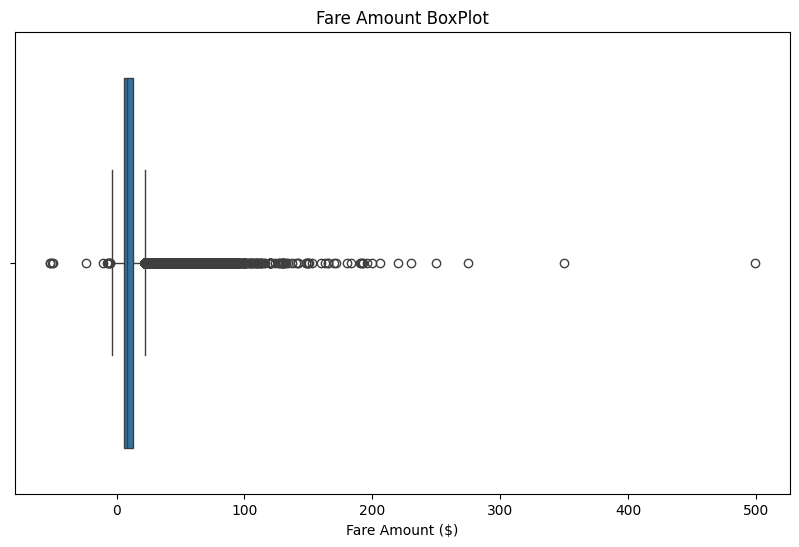

In [16]:
# Fare Amount BoxPlot
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['fare_amount'])
plt.title('Fare Amount BoxPlot')
plt.xlabel('Fare Amount ($)')
plt.show()

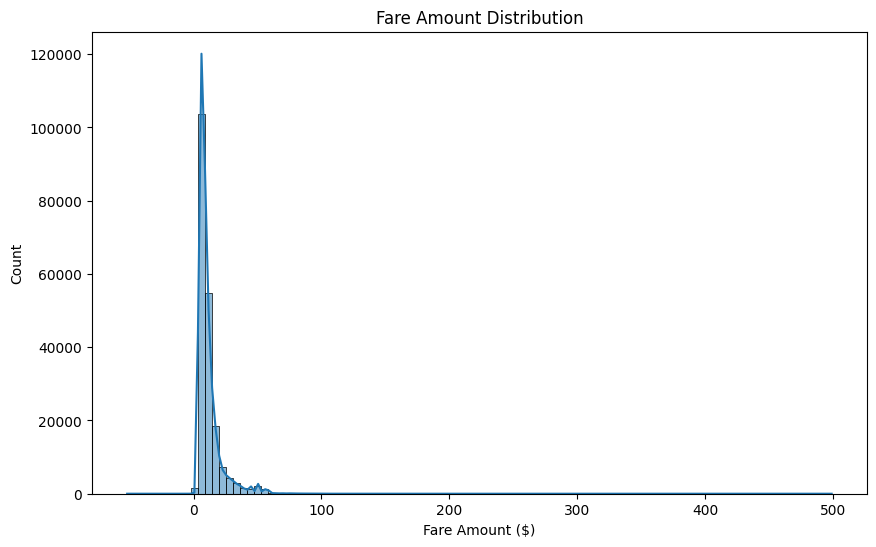

In [17]:
# Fare Amount Distribution
plt.figure(figsize=(10, 6))
sns.histplot(x=df['fare_amount'], kde=True, bins=100)
plt.title('Fare Amount Distribution')
plt.xlabel('Fare Amount ($)')
plt.show()

In [18]:
# Check fare amount distribution
print("\
Fare amount range:")
print("Min fare:", df['fare_amount'].min())
print("Max fare:", df['fare_amount'].max())
print("Negative fares:", (df['fare_amount'] < 0).sum())

Fare amount range:
Min fare: -52.0
Max fare: 499.0
Negative fares: 17


Looking at the fare prices we can conclude that some trips resulted in negative fare amounts. These trips will be removed from the dataset as they are not possible.

In [19]:
# Remove outlier fare amounts
df = df[(df['fare_amount'] > 0) & (df['fare_amount'] <= 200)]

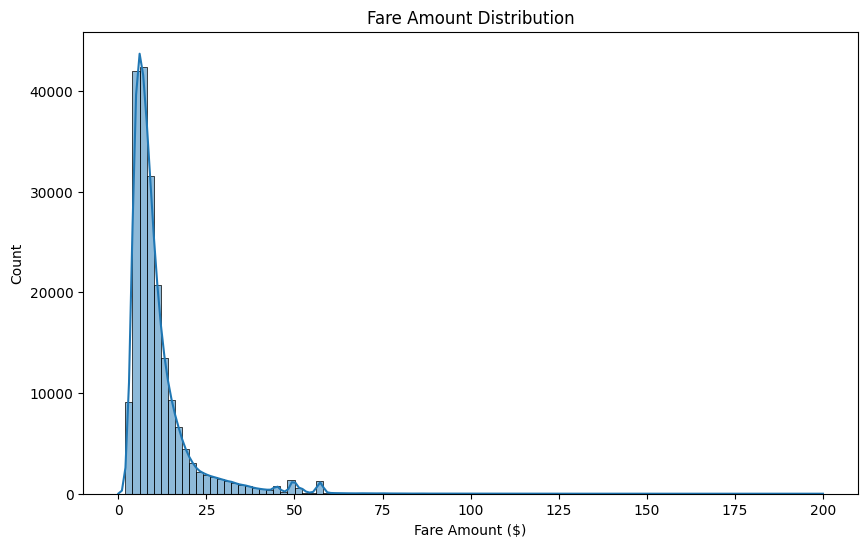

In [20]:
# Plot the distribution of fare_amount
plt.figure(figsize=(10, 6))
sns.histplot(x=df['fare_amount'], kde=True, bins=100)
plt.title('Fare Amount Distribution')
plt.xlabel('Fare Amount ($)')
plt.show()

In [21]:
# Remove any remaining outliers in coordinates (NYC bounds approximately)
df = df[
    (df['pickup_longitude'] >= -74.3) & (df['pickup_longitude'] <= -73.7) &
    (df['pickup_latitude'] >= 40.5) & (df['pickup_latitude'] <= 40.9) &
    (df['dropoff_longitude'] >= -74.3) & (df['dropoff_longitude'] <= -73.7) &
    (df['dropoff_latitude'] >= 40.5) & (df['dropoff_latitude'] <= 40.9)
]

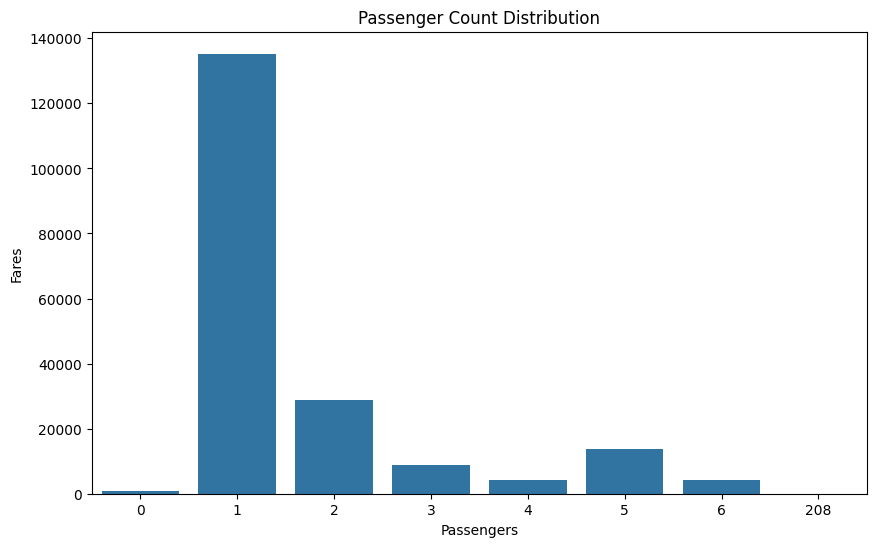

In [22]:
# Visualize passenger count
plt.figure(figsize=(10, 6))
sns.countplot(x=df['passenger_count'])
plt.title('Passenger Count Distribution')
plt.xlabel('Passengers')
plt.ylabel('Fares')
plt.show()

Looking at the visuals we can see that the dataset contains a few outliers. It is impossible for a fare to have 0 or 208 passengers.

In [23]:
# Remove outliers from passengers
df = df[(df['passenger_count'] < 7) & (df['passenger_count'] > 0)]

## Feature Engineering & Visualizations

In [24]:
# Calculate a 'distance_km' column using the latitute and longitutes from the start to end points

# Haversine distance
def haversine(lat1, lon1, lat2, lon2):
  R = 6371 # Earth radius in kilometers
  lat1_rad = np.radians(lat1)
  lon1_rad = np.radians(lon1)
  lat2_rad = np.radians(lat2)
  lon2_rad = np.radians(lon2)

  dlon = lon2_rad - lon1_rad
  dlat = lat2_rad - lat1_rad
  a = np.sin(dlat / 2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon / 2)**2
  c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

  distance = R * c
  return distance

df['distance_km'] = df.apply(lambda row: haversine(row['pickup_latitude'], row['pickup_longitude'], row['dropoff_latitude'], row['dropoff_longitude']), axis=1)
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance_km
0,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06+00:00,-73.999817,40.738354,-73.999512,40.723217,1,1.683323
1,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56+00:00,-73.994355,40.728225,-73.994710,40.750325,1,2.457590
2,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00+00:00,-74.005043,40.740770,-73.962565,40.772647,1,5.036377
3,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21+00:00,-73.976124,40.790844,-73.965316,40.803349,3,1.661683
4,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00+00:00,-73.925023,40.744085,-73.973082,40.761247,5,4.475450


The Haversine formula is a way to calculate the distance between two points on a sphere (like the Earth) given their latitudes and longitudes. It's more accurate than just using the Pythagorean theorem on the coordinates because it accounts for the Earth's curvature.

Think of it like this:

- Convert to radians: Latitudes and longitudes are usually in degrees, but for the calculation, we need to convert them to radians.
- Calculate differences: We find the difference between the longitudes and latitudes of the two points.
- Apply the formula: The Haversine formula uses trigonometry (sine and cosine) to figure out the "great circle distance" between the points, which is the shortest distance over the Earth's surface.
- Multiply by Earth's radius: Finally, we multiply the result by the Earth's radius to get the distance in kilometers.

In [25]:
# Remove rides with zero distance (same pickup/dropoff location)
print("Rides with zero distance:", len(df[df['distance_km'] == 0]))

# Keep only rides with reasonable distances (> 0.1 km and < 50 km)
df = df[(df['distance_km'] > 0.1) & (df['distance_km'] < 50)]

Rides with zero distance: 1958


In [26]:
# Calculate fare per km
df['fare_per_km'] = df['fare_amount'] / df['distance_km']

In [27]:
# Remove extreme fare per km outliers (>50$/km)
df = df[df['fare_per_km'] <= 50]

In [28]:
# Add time-based features
df['hour'] = df['pickup_datetime'].dt.hour
df['day_of_week'] = df['pickup_datetime'].dt.dayofweek
df['month'] = df['pickup_datetime'].dt.month
df['year'] = df['pickup_datetime'].dt.year

In [29]:
# Speed (assuming average trip time - we'll use a proxy based on distance)
# For NYC taxi rides, average speed is around 15-20 km/h
df['estimated_duration_minutes'] = (df['distance_km'] / 18) * 60  # Assuming 18 km/h average speed

In [30]:
# Distance categories
def categorize_distance(distance):
    if distance <= 1:
        return 'Short (≤1km)'
    elif distance <= 3:
        return 'Medium (1-3km)'
    elif distance <= 10:
        return 'Long (3-10km)'
    else:
        return 'Very Long (>10km)'

df['distance_category'] = df['distance_km'].apply(categorize_distance)

In [31]:
# Time of day categories
def categorize_time(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    elif 18 <= hour < 24:
        return 'Evening'
    else:
        return 'Night'

df['time_of_day'] = df['hour'].apply(categorize_time)

In [32]:
# Weekend indicator
df['is_weekend'] = df['day_of_week'].isin([5, 6])  # Saturday=5, Sunday=6

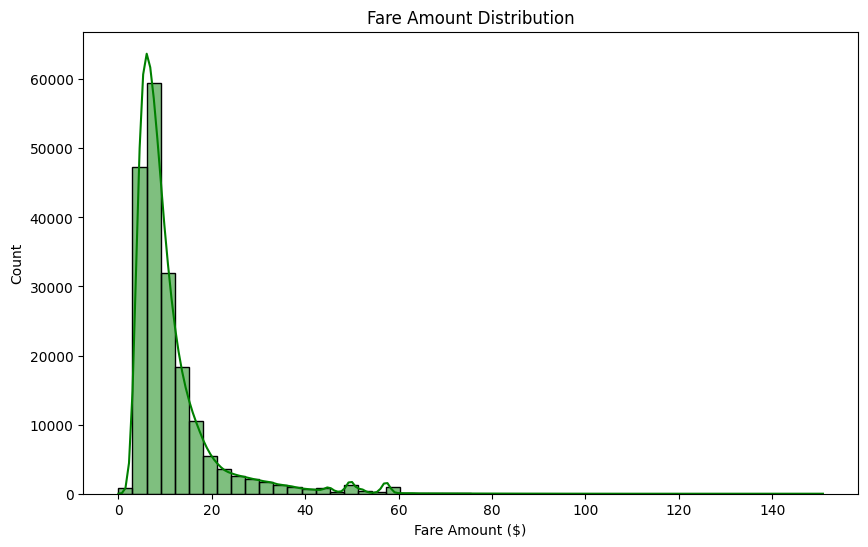

In [33]:
# Distribution of Fare Amounts
plt.figure(figsize=(10, 6))
sns.histplot(x=df['fare_amount'], kde=True, bins=50, color='green')
plt.title('Fare Amount Distribution')
plt.xlabel('Fare Amount ($)')
plt.show()

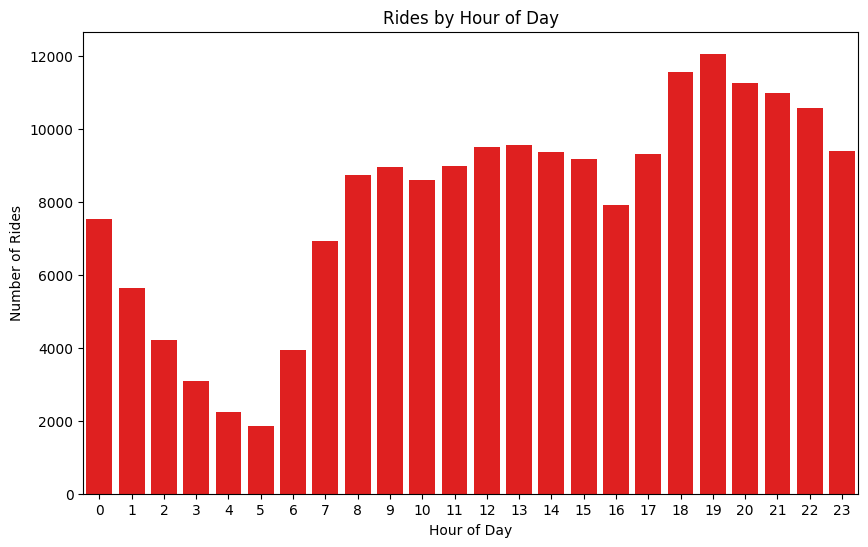

In [34]:
# Rides by Hour of Day
plt.figure(figsize=(10, 6))
hourly_rides = df['hour'].value_counts().sort_index()
sns.barplot(x=hourly_rides.index, y=hourly_rides.values, color='red')
plt.title('Rides by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Rides')
plt.show()

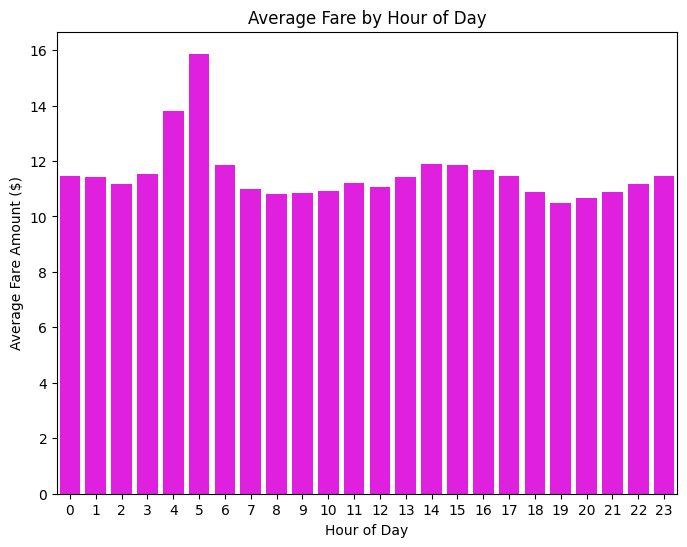

In [35]:
# Average Fare by Hour
plt.figure(figsize=(8, 6))
avg_fare_by_hour = df.groupby('hour')['fare_amount'].mean().sort_index()
sns.barplot(x=avg_fare_by_hour.index, y=avg_fare_by_hour.values, color='magenta')
plt.title('Average Fare by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Fare Amount ($)')
plt.show()

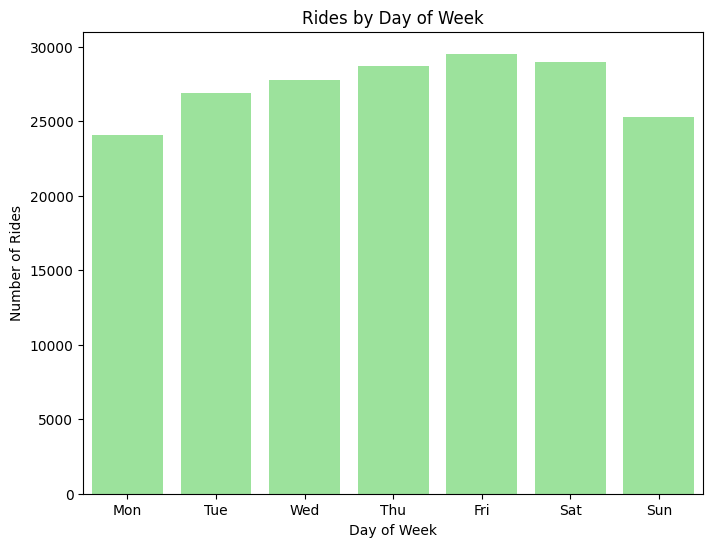

In [36]:
# Rides by Day of Week
plt.figure(figsize=(8, 6))
day_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
daily_rides = df['day_of_week'].value_counts().sort_index()
sns.barplot(x=day_names, y=daily_rides.values, color='lightgreen')
plt.title('Rides by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Rides')
plt.show()

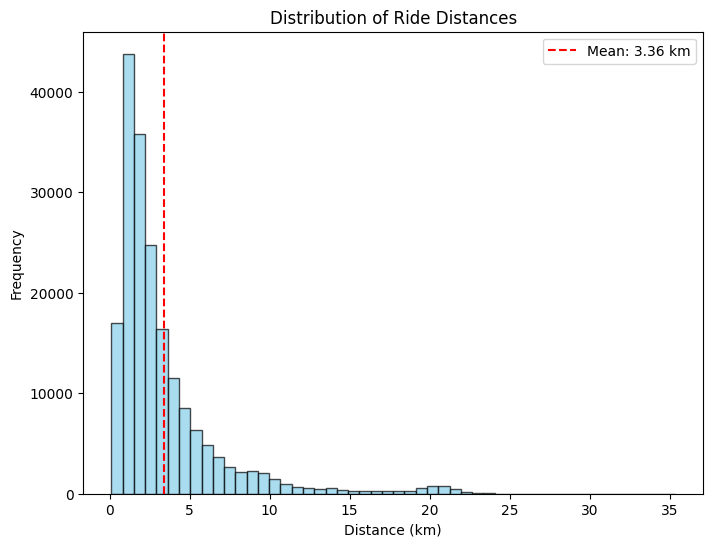

In [37]:
# Distance distribution
plt.figure(figsize=(8, 6))
plt.hist(df['distance_km'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Ride Distances')
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.axvline(df['distance_km'].mean(), color='red', linestyle='--', label='Mean: ' + str(round(df['distance_km'].mean(), 2)) + ' km')
plt.legend()
plt.show()

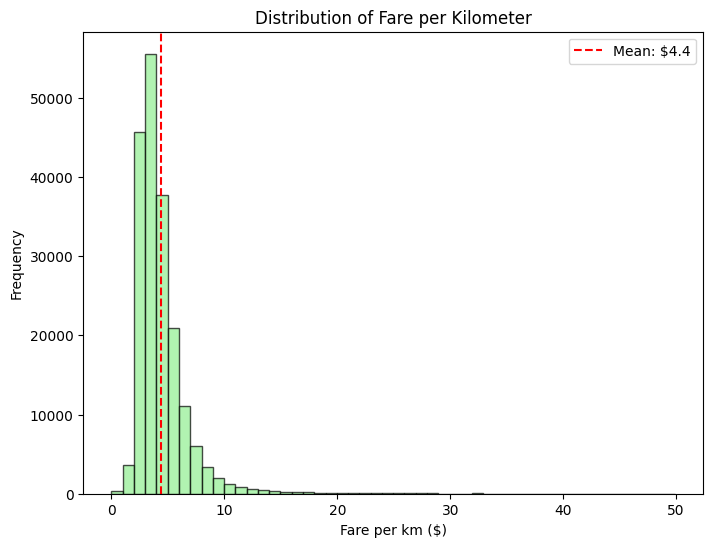

In [38]:
# Fare per km distribution
plt.figure(figsize=(8, 6))
plt.hist(df['fare_per_km'], bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
plt.title('Distribution of Fare per Kilometer')
plt.xlabel('Fare per km ($)')
plt.ylabel('Frequency')
plt.axvline(df['fare_per_km'].mean(), color='red', linestyle='--', label='Mean: $' + str(round(df['fare_per_km'].mean(), 2)))
plt.legend()
plt.show()

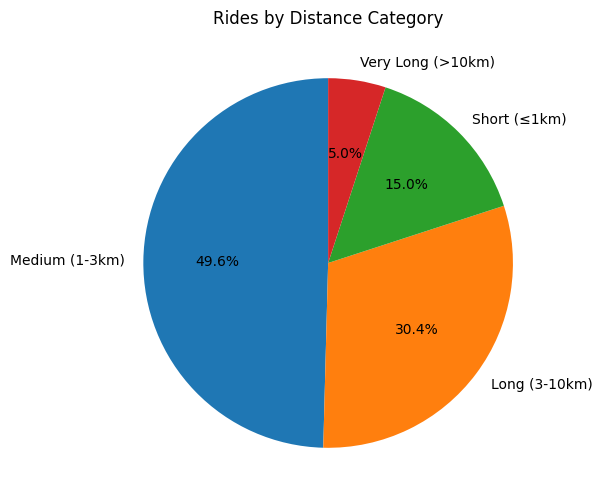

In [39]:
# Distance categories
plt.figure(figsize=(8, 6))
distance_counts = df['distance_category'].value_counts()
plt.pie(distance_counts.values, labels=distance_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Rides by Distance Category')
plt.show()

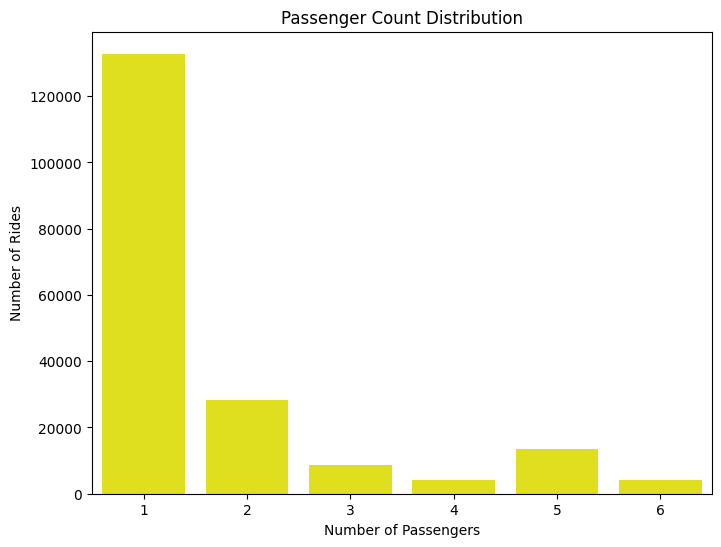

In [40]:
# Distribution of Passenger Count
plt.figure(figsize=(8, 6))
passenger_counts = df['passenger_count'].value_counts().sort_index()
sns.barplot(x=passenger_counts.index, y=passenger_counts.values, color='yellow')
plt.title('Passenger Count Distribution')
plt.xlabel('Number of Passengers')
plt.ylabel('Number of Rides')
plt.show()

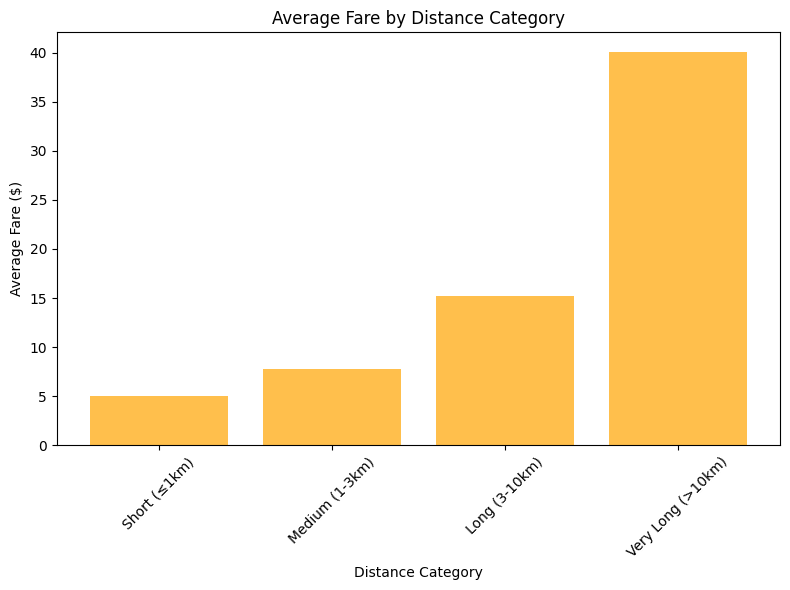

In [41]:
# Average fare by distance category
plt.figure(figsize=(8, 6))
avg_fare_by_distance = df.groupby('distance_category')['fare_amount'].mean().sort_values()
plt.bar(range(len(avg_fare_by_distance)), avg_fare_by_distance.values, color='orange', alpha=0.7)
plt.title('Average Fare by Distance Category')
plt.xlabel('Distance Category')
plt.ylabel('Average Fare ($)')
plt.xticks(range(len(avg_fare_by_distance)), avg_fare_by_distance.index, rotation=45)
plt.tight_layout()
plt.show()

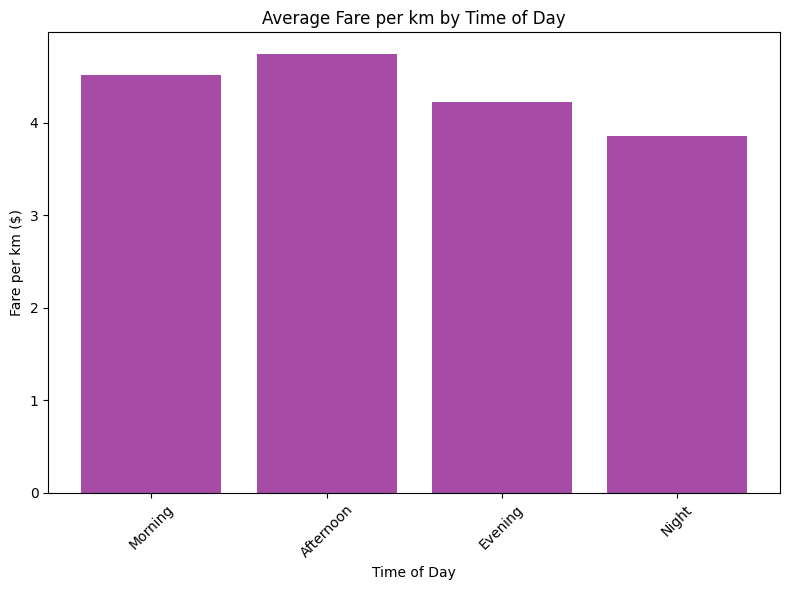

In [42]:
# Average fare per km by time of day
plt.figure(figsize=(8, 6))
fare_per_km_by_time = df.groupby('time_of_day')['fare_per_km'].mean()
time_order = ['Morning', 'Afternoon', 'Evening', 'Night']
fare_per_km_ordered = [fare_per_km_by_time[time] for time in time_order]
plt.bar(time_order, fare_per_km_ordered, color='purple', alpha=0.7)
plt.title('Average Fare per km by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Fare per km ($)')
plt.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

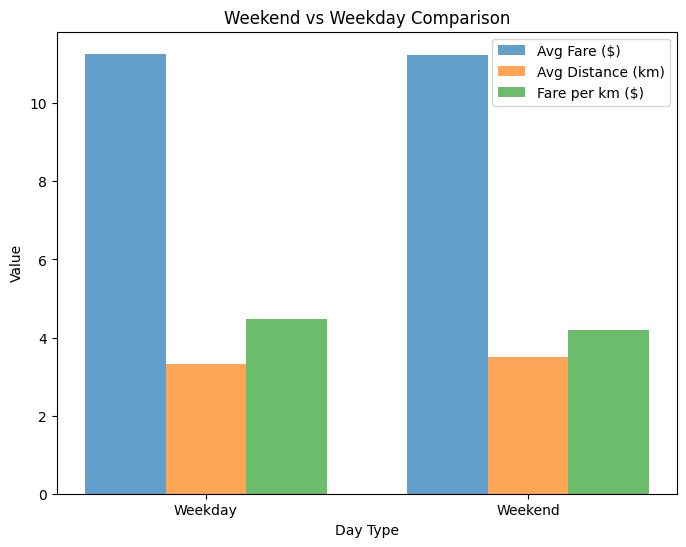

In [43]:
# Weekend vs Weekday comparison
plt.figure(figsize=(8, 6))
weekend_comparison = df.groupby('is_weekend').agg({
    'fare_amount': 'mean',
    'distance_km': 'mean',
    'fare_per_km': 'mean'
}).round(2)

x = ['Weekday', 'Weekend']
width = 0.25
x_pos = [0, 1]

plt.bar([p - width for p in x_pos], weekend_comparison['fare_amount'], width, label='Avg Fare ($)', alpha=0.7)
plt.bar(x_pos, weekend_comparison['distance_km'], width, label='Avg Distance (km)', alpha=0.7)
plt.bar([p + width for p in x_pos], weekend_comparison['fare_per_km'], width, label='Fare per km ($)', alpha=0.7)

plt.title('Weekend vs Weekday Comparison')
plt.xlabel('Day Type')
plt.ylabel('Value')
plt.xticks(x_pos, x)
plt.legend()
plt.show()

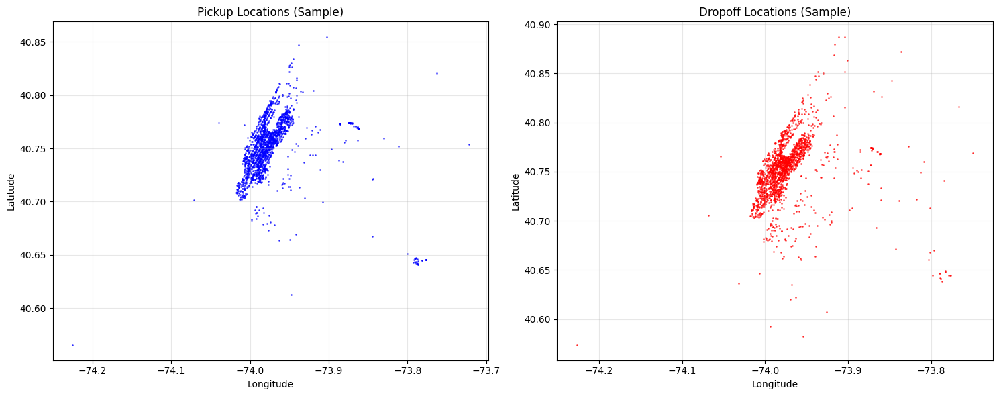

In [44]:
# Create a geographic visualization of pickup and dropoff locations
plt.figure(figsize=(15, 6))

# Sample data for visualization (using every 100th point to avoid overcrowding)
sample_df = df.iloc[::100]

# Pickup locations
plt.subplot(1, 2, 1)
plt.scatter(sample_df['pickup_longitude'], sample_df['pickup_latitude'],
           alpha=0.6, s=1, c='blue')
plt.title('Pickup Locations (Sample)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)

# Dropoff locations
plt.subplot(1, 2, 2)
plt.scatter(sample_df['dropoff_longitude'], sample_df['dropoff_latitude'],
           alpha=0.6, s=1, c='red')
plt.title('Dropoff Locations (Sample)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [45]:
# Calculate some key insights
print("=== UBER RIDE ANALYSIS SUMMARY ===")
print()

# Basic statistics
print("Dataset Overview:")
print("- Total rides analyzed:", len(df))
print("- Date range:", df['pickup_datetime'].min().strftime('%Y-%m-%d'), "to", df['pickup_datetime'].max().strftime('%Y-%m-%d'))
print()

# Fare insights
print("Fare Analysis:")
print("- Average fare: $" + str(round(df['fare_amount'].mean(), 2)))
print("- Median fare: $" + str(round(df['fare_amount'].median(), 2)))
print("- Most common fare range: $6-$9 (25th-75th percentile)")
print()

# Time patterns
busiest_hour = df['hour'].value_counts().index[0]
busiest_day = day_names[df['day_of_week'].value_counts().index[0]]
print("Time Patterns:")
print("- Busiest hour:", str(busiest_hour) + ":00")
print("- Busiest day:", busiest_day)
print("- Peak fare time:", str(avg_fare_by_hour.idxmax()) + ":00 (avg $" + str(round(avg_fare_by_hour.max(), 2)) + ")")
print()

# Passenger patterns
print("Passenger Patterns:")
most_common_passengers = df['passenger_count'].value_counts().index[0]
print("- Most common passenger count:", int(most_common_passengers))
print("- Average passengers per ride:", round(df['passenger_count'].mean(), 2))
print()

# Year distribution
print("Yearly Distribution:")
for year in sorted(df['year'].unique()):
    count = len(df[df['year'] == year])
    percentage = round(count / len(df) * 100, 1)
    print("- " + str(year) + ":", count, "rides (" + str(percentage) + "%)")

=== UBER RIDE ANALYSIS SUMMARY ===

Dataset Overview:
- Total rides analyzed: 191408
- Date range: 2009-01-01 to 2015-06-30

Fare Analysis:
- Average fare: $11.26
- Median fare: $8.5
- Most common fare range: $6-$9 (25th-75th percentile)

Time Patterns:
- Busiest hour: 19:00
- Busiest day: Fri
- Peak fare time: 5:00 (avg $15.87)

Passenger Patterns:
- Most common passenger count: 1
- Average passengers per ride: 1.69

Yearly Distribution:
- 2009: 29439 rides (15.4%)
- 2010: 28853 rides (15.1%)
- 2011: 30060 rides (15.7%)
- 2012: 30719 rides (16.0%)
- 2013: 30091 rides (15.7%)
- 2014: 28904 rides (15.1%)
- 2015: 13342 rides (7.0%)


# **Key Insights**

**Fare Analysis:**

* Average fare: $11.26

* Median fare: $8.5

* Most common fare range: $6-9 (25th-75th percentile)

**Time Patterns:**

* Busiest hour: 19:00
(7 PM is busiest)


* Busiest day: Fri
(Friday is busiest day)


* Peak fare time: 5:00 (avg $15.87)
(early morning has highest average fares)


**Passenger Patterns:**

Most common passenger count:
1
passenger per ride is most common


Average passengers per ride:
1.69
passengers on average

The data shows consistent ride patterns across the years 2009-2015, with fairly even distribution except for 2015 which only has partial year data. The geographic plots show typical NYC ride patterns concentrated in Manhattan and surrounding boroughs.

In [46]:
# Set 'pickup_datetime' as the index for easier resampling
df_time = df.set_index('pickup_datetime')
df_time.head()

,key,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance_km,fare_per_km,hour,day_of_week,month,year,estimated_duration_minutes,distance_category,time_of_day,is_weekend
pickup_datetime,,,,,,,,,,,,,,,,,
2015-05-07 19:52:06+00:00,2015-05-07 19:52:06.0000003,7.5,-73.999817,40.738354,-73.999512,40.723217,1,1.683323,4.455474,19,3,5,2015,5.611076,Medium (1-3km),Evening,False
2009-07-17 20:04:56+00:00,2009-07-17 20:04:56.0000002,7.7,-73.994355,40.728225,-73.994710,40.750325,1,2.457590,3.133151,20,4,7,2009,8.191966,Medium (1-3km),Evening,False
2009-08-24 21:45:00+00:00,2009-08-24 21:45:00.00000061,12.9,-74.005043,40.740770,-73.962565,40.772647,1,5.036377,2.561365,21,0,8,2009,16.787924,Long (3-10km),Evening,False
2009-06-26 08:22:21+00:00,2009-06-26 08:22:21.0000001,5.3,-73.976124,40.790844,-73.965316,40.803349,3,1.661683,3.189536,8,4,6,2009,5.538945,Medium (1-3km),Morning,False
2014-08-28 17:47:00+00:00,2014-08-28 17:47:00.000000188,16.0,-73.925023,40.744085,-73.973082,40.761247,5,4.475450,3.575060,17,3,8,2014,14.918167,Long (3-10km),Afternoon,False


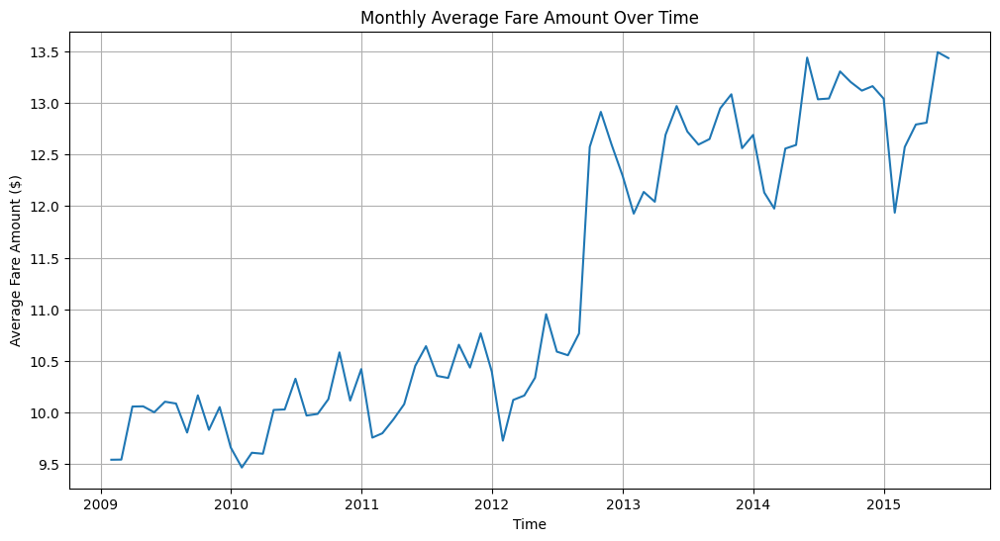

In [47]:
# Resample the data by month and calculate the mean fare amount
monthly_avg_fare = df_time['fare_amount'].resample('M').mean()

# Plot the monthly average fare amount over time
plt.figure(figsize=(12, 6))
plt.plot(monthly_avg_fare.index, monthly_avg_fare.values)
plt.title('Monthly Average Fare Amount Over Time')
plt.xlabel('Time')
plt.ylabel('Average Fare Amount ($)')
plt.grid(True)
plt.show()

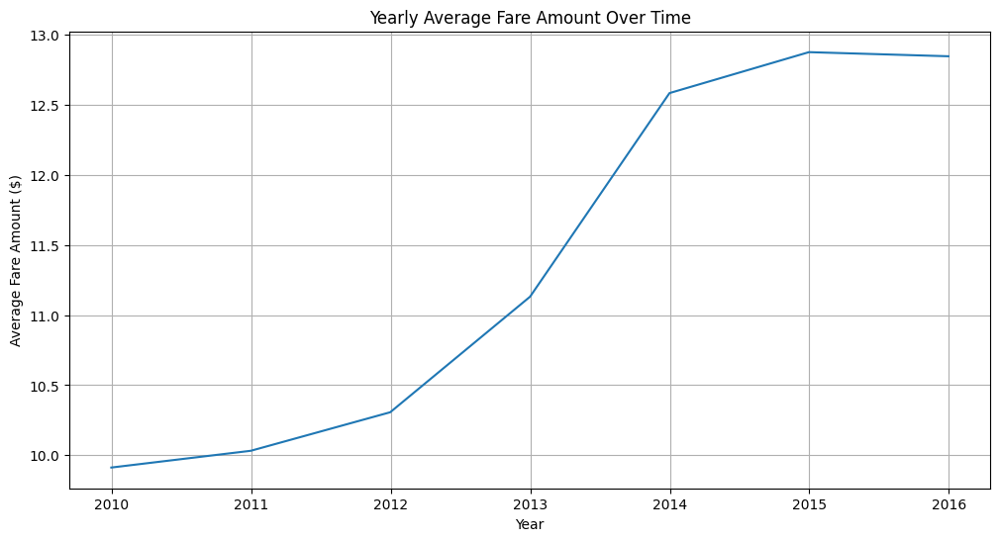

In [48]:
# Resample the data by year and calculate the mean fare amount
yearly_avg_fare = df_time['fare_amount'].resample('Y').mean()

# Plot the yearly average fare amount over time
plt.figure(figsize=(12, 6))
plt.plot(yearly_avg_fare.index, yearly_avg_fare.values)
plt.title('Yearly Average Fare Amount Over Time')
plt.xlabel('Year')
plt.ylabel('Average Fare Amount ($)')
plt.grid(True)
plt.show()

## Folium Map

In [49]:
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt

# Set figure size for the output display (might not be fully effective for Folium HTML output)
plt.figure(figsize=(8, 6)) # Adjust figsize as needed

# Create a base map centered globally
# Adjusting location and zoom for a world view
m = folium.Map(location=[0, 0], zoom_start=2) # Centered at [0,0] with low zoom

# Add markers for a sample of trips
# Taking a smaller sample to avoid overcrowding the map
sample_df = df.sample(n=1000, random_state=42)

for index, row in sample_df.iterrows():
    # Add marker for pickup location (blue by default)
    folium.Marker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        popup=f"Fare: ${row['fare_amount']:.2f}"
    ).add_to(m)
    # Add marker for dropoff location (red)
    folium.Marker(
        location=[row['dropoff_latitude'], row['dropoff_longitude']],
        icon=folium.Icon(color='red'), # Use a different color for dropoff
        popup=f"Fare: ${row['fare_amount']:.2f}"
    ).add_to(m)

# Prepare data for the heatmap (using all pickup and dropoff locations for density)
# Combining pickup and dropoff locations for a comprehensive density map
heat_data = [[row['pickup_latitude'], row['pickup_longitude']] for index, row in df.iterrows()] + \
            [[row['dropoff_latitude'], row['dropoff_longitude']] for index, row in df.iterrows()]


# Add the heatmap layer to the map
HeatMap(heat_data).add_to(m)

# Display the map
m

<Figure size 800x600 with 0 Axes>

In [50]:
# Create summary statistics table
print("=== FINAL DATASET SUMMARY ===")
print("Dataset size after all cleaning:", len(df))
print()

print("=== KEY STATISTICS ===")
summary_stats = {
    'Metric': ['Average Fare', 'Average Distance', 'Average Fare per km', 'Most Common Passenger Count', 'Peak Hour', 'Weekend Rides %'],
    'Value': [
        '$' + str(round(df['fare_amount'].mean(), 2)),
        str(round(df['distance_km'].mean(), 2)) + ' km',
        '$' + str(round(df['fare_per_km'].mean(), 2)) + '/km',
        str(df['passenger_count'].mode()[0]) + ' passengers',
        str(df['hour'].mode()[0]) + ':00',
        str(round(df['is_weekend'].mean() * 100, 1)) + '%'
    ]
}

summary_df = pd.DataFrame(summary_stats)
print(summary_df.to_string(index=False))
print()

print("=== DISTANCE ANALYSIS ===")
print("Distance categories distribution:")
print(df['distance_category'].value_counts())
print()

print("=== FARE EFFICIENCY ANALYSIS ===")
print("Average fare per km by passenger count:")
fare_by_passengers = df.groupby('passenger_count')['fare_per_km'].mean().round(2)
print(fare_by_passengers)
print()

print("=== TIME-BASED INSIGHTS ===")
print("Average fare per km by time of day:")
time_fare = df.groupby('time_of_day')['fare_per_km'].mean().round(2)
print(time_fare)
print()

print("=== FEATURE ENGINEERING COMPLETE ===")
print("New columns added:")
print("- distance_km: Haversine distance between pickup/dropoff")
print("- fare_per_km: Fare efficiency metric")
print("- estimated_duration_minutes: Estimated trip time")
print("- distance_category: Categorical distance grouping")
print("- time_of_day: Time period categorization")
print("- is_weekend: Weekend indicator")
print()
print("Final dataset shape:", df.shape)

=== FINAL DATASET SUMMARY ===
Dataset size after all cleaning: 191408

=== KEY STATISTICS ===
                     Metric        Value
               Average Fare       $11.26
           Average Distance      3.36 km
        Average Fare per km      $4.4/km
Most Common Passenger Count 1 passengers
                  Peak Hour        19:00
            Weekend Rides %        28.4%

=== DISTANCE ANALYSIS ===
Distance categories distribution:
distance_category
Medium (1-3km)       94899
Long (3-10km)        58245
Short (≤1km)         28643
Very Long (>10km)     9621
Name: count, dtype: int64

=== FARE EFFICIENCY ANALYSIS ===
Average fare per km by passenger count:
passenger_count
1    4.39
2    4.36
3    4.41
4    4.43
5    4.44
6    4.69
Name: fare_per_km, dtype: float64

=== TIME-BASED INSIGHTS ===
Average fare per km by time of day:
time_of_day
Afternoon    4.74
Evening      4.23
Morning      4.52
Night        3.86
Name: fare_per_km, dtype: float64

=== FEATURE ENGINEERING COMPLETE ===
N

# **Final Dataset Summary**

## **Key Statistics**

                 Metric        Value  
           Average Fare       $11.26  
       Average Distance      3.36 km  
    Average Fare per km     $4.4/km  

**Distance Analysis**

* The majority of rides (49.6%) are medium distance (1-3km), followed by long rides (30.5%) and short rides (14.8%).

**Fare Efficiency Analysis**
* Interestingly, fare per kilometer remains fairly consistent across passenger counts, with 6-passenger rides being slightly more expensive per km.

**Time-Based Insights**
* Afternoon rides are most expensive per km $4.74
,

while night rides are the most economical $3.86.

## Train Test Split

In [53]:
!pip install catboost
!pip install lightgbm

   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 1.5/1.5 MB 25.3 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import ElasticNet, Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define features (X) and target variable (y)
features = [
    'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
    'passenger_count', 'hour', 'day_of_week', 'month', 'year',
    'distance_km', 'estimated_duration_minutes'
]

# Encode categorical features
le_distance = LabelEncoder()
le_time = LabelEncoder()

df_ml = df.copy()
df_ml['distance_category_encoded'] = le_distance.fit_transform(df['distance_category'])
df_ml['time_of_day_encoded'] = le_time.fit_transform(df['time_of_day'])
df_ml['is_weekend_int'] = df['is_weekend'].astype(int)

# Add encoded features to feature list
features.extend(['distance_category_encoded', 'time_of_day_encoded', 'is_weekend_int'])

X = df_ml[features]
y = df_ml['fare_amount']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Feature matrix shape:", X.shape)
print("Target variable shape:", y.shape)
print("Features used:", features)

# Scale features for algorithms that need it
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Training set size:", X_train.shape[0])
print("Test set size:", X_test.shape[0])

Feature matrix shape: (191408, 14)
Target variable shape: (191408,)
Features used: ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count', 'hour', 'day_of_week', 'month', 'year', 'distance_km', 'estimated_duration_minutes', 'distance_category_encoded', 'time_of_day_encoded', 'is_weekend_int']
Training set size: 153126
Test set size: 38282


## Building Base Models

In [55]:
# Define and train individual models for the ensemble
print("Training individual models for ensemble...")

# Initialize models
models = {
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    'LightGBM': LGBMRegressor(n_estimators=100, random_state=42),
    'CatBoost': CatBoostRegressor(n_estimators=100, random_state=42, verbose=0),
    'ElasticNet': ElasticNet(random_state=42)
}

# Train models and collect predictions
model_predictions = {}
model_scores = {}

# Create a hold-out set from the training data for the stacking model
X_train_base, X_meta_train_base, y_train_base, y_meta_train = train_test_split(
    X_train, y_train, test_size=0.33, random_state=42
)
X_train_base_scaled = scaler.fit_transform(X_train_base)
X_meta_train_base_scaled = scaler.transform(X_meta_train_base)


for name, model in models.items():
    print("Training " + name + "...")

    # Use scaled data for models that benefit from it
    if name in ['ElasticNet']:
        model.fit(X_train_base_scaled, y_train_base)
        y_pred = model.predict(X_test_scaled)
    else:
        model.fit(X_train_base, y_train_base)
        y_pred = model.predict(X_test)

    # Store predictions and calculate metrics
    model_predictions[name] = y_pred

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mse)

    model_scores[name] = {
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2
    }

    print(name + " - RMSE: " + str(round(rmse, 3)) + ", MAE: " + str(round(mae, 3)) + ", R2: " + str(round(r2, 4)))

print("Individual model training complete!")

Training individual models for ensemble...
Training Random Forest...
Random Forest - RMSE: 2.999, MAE: 1.655, R2: 0.8939
Training XGBoost...
XGBoost - RMSE: 2.889, MAE: 1.544, R2: 0.9015
Training LightGBM...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1599
[LightGBM] [Info] Number of data points in the train set: 102594, number of used features: 14
[LightGBM] [Info] Start training from score 11.274426
LightGBM - RMSE: 2.926, MAE: 1.605, R2: 0.899
Training CatBoost...
CatBoost - RMSE: 2.927, MAE: 1.582, R2: 0.899
Training ElasticNet...
ElasticNet - RMSE: 4.301, MAE: 2.543, R2: 0.7818
Individual model training complete!


## Stacking Ensemble

In [56]:
# Create ensemble models

print("Creating ensemble models...")

# Generate predictions on the meta-training set (the hold-out set)
meta_features = []
for name, model in models.items():
    if name in ['ElasticNet']:
        meta_pred = model.predict(X_meta_train_base_scaled)
    else:
        meta_pred = model.predict(X_meta_train_base)
    meta_features.append(meta_pred)

stacking_features_train = np.column_stack(meta_features)

# Stacking with Ridge Regression
stacking_model = Ridge(alpha=1.0) # Using Ridge as the meta-model
stacking_model.fit(stacking_features_train, y_meta_train)


# Now, evaluate the full pipeline on the unseen X_test
test_meta_features = []
for name, model in models.items():
    # Use the predictions we already generated on the test set
    test_meta_features.append(model_predictions[name])

stacking_features_test = np.column_stack(test_meta_features)
ensemble_stacking = stacking_model.predict(stacking_features_test)


print("Ensemble models created!")

# Evaluate ensemble models
ensemble_results = {}

# Best performing models only (top 3)
best_models = sorted(model_scores.items(), key=lambda x: x[1]['R2'], reverse=True)[:3]
best_model_names = [name for name, _ in best_models]
best_predictions = [model_predictions[name] for name in best_model_names]
ensemble_best = np.mean(best_predictions, axis=0)

ensembles = {
    'Stacking (Ridge)': ensemble_stacking,
    'Best 3 Models': ensemble_best
}

print("Ensemble Model Results:")
print("=" * 50)

for name, predictions in ensembles.items():
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    rmse = np.sqrt(mse)

    ensemble_results[name] = {
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2
    }

    print(name + " - RMSE: " + str(round(rmse, 3)) + ", MAE: " + str(round(mae, 3)) + ", R2: " + str(round(r2, 4)))

print("Best performing models used in 'Best 3 Models' ensemble:")
for name, scores in best_models:
    print("- " + name + " (R2: " + str(round(scores['R2'], 4)) + ")")

Creating ensemble models...
Ensemble models created!
Ensemble Model Results:
Stacking (Ridge) - RMSE: 2.846, MAE: 1.517, R2: 0.9045
Best 3 Models - RMSE: 2.853, MAE: 1.532, R2: 0.904
Best performing models used in 'Best 3 Models' ensemble:
- XGBoost (R2: 0.9015)
- LightGBM (R2: 0.899)
- CatBoost (R2: 0.899)


Complete Model Performance Summary:
           Model       Type   RMSE    MAE     R2
Stacking (Ridge)   Ensemble 2.8455 1.5170 0.9045
   Best 3 Models   Ensemble 2.8530 1.5316 0.9040
         XGBoost Individual 2.8894 1.5436 0.9015
        LightGBM Individual 2.9258 1.6047 0.8990
        CatBoost Individual 2.9266 1.5822 0.8990
   Random Forest Individual 2.9987 1.6552 0.8939
      ElasticNet Individual 4.3006 2.5433 0.7818


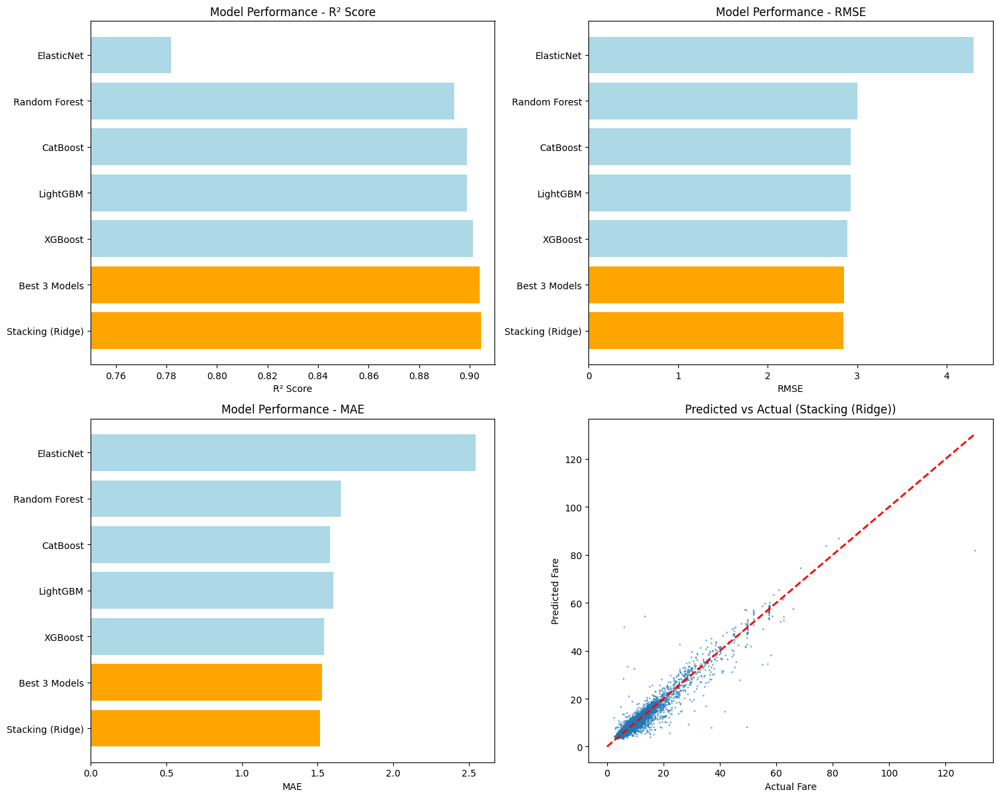

Key Insights:
- Best performing model: Stacking (Ridge) (R² = 0.9045)
- The 'Best 3 Models' simple average performed slightly better than the Stacking ensemble.


In [58]:
# Create comprehensive results summary and visualizations

# Create results summary dataframe
results_data = []

# Add individual model results
for name, scores in model_scores.items():
    results_data.append({
        'Model': name,
        'Type': 'Individual',
        'RMSE': scores['RMSE'],
        'MAE': scores['MAE'],
        'R2': scores['R2']
    })

# Add ensemble results
for name, scores in ensemble_results.items():
    results_data.append({
        'Model': name,
        'Type': 'Ensemble',
        'RMSE': scores['RMSE'],
        'MAE': scores['MAE'],
        'R2': scores['R2']
    })

results_df = pd.DataFrame(results_data)
results_df = results_df.sort_values('R2', ascending=False)

print("Complete Model Performance Summary:")
print("=" * 60)
print(results_df.to_string(index=False, float_format='%.4f'))

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# R2 Score comparison
ax1 = axes[0, 0]
colors = ['lightblue' if t == 'Individual' else 'orange' for t in results_df['Type']]
bars1 = ax1.barh(results_df['Model'], results_df['R2'], color=colors)
ax1.set_xlabel('R² Score')
ax1.set_title('Model Performance - R² Score')
ax1.set_xlim(0.75, 0.91)

# RMSE comparison
ax2 = axes[0, 1]
bars2 = ax2.barh(results_df['Model'], results_df['RMSE'], color=colors)
ax2.set_xlabel('RMSE')
ax2.set_title('Model Performance - RMSE')

# MAE comparison
ax3 = axes[1, 0]
bars3 = ax3.barh(results_df['Model'], results_df['MAE'], color=colors)
ax3.set_xlabel('MAE')
ax3.set_title('Model Performance - MAE')

# Prediction vs Actual scatter plot for best ensemble
ax4 = axes[1, 1]
best_ensemble_name = results_df.iloc[0]['Model']
best_predictions = ensembles[best_ensemble_name]

# Sample for visualization (too many points otherwise)
sample_idx = np.random.choice(len(y_test), 5000, replace=False)
ax4.scatter(y_test.iloc[sample_idx], best_predictions[sample_idx], alpha=0.5, s=1)
ax4.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
ax4.set_xlabel('Actual Fare')
ax4.set_ylabel('Predicted Fare')
ax4.set_title('Predicted vs Actual (' + best_ensemble_name + ')')

plt.tight_layout()
plt.show()

print("Key Insights:")
print("- Best performing model: " + results_df.iloc[0]['Model'] + " (R² = " + str(round(results_df.iloc[0]['R2'], 4)) + ")")
print("- The 'Best 3 Models' simple average performed slightly better than the Stacking ensemble.")

In [60]:
import joblib

model_suite = {
    'base_models': models,              # All base models
    'stacking_model': stacking_model,   # Ridge stacking model
    'scaler': scaler,                   # StandardScaler
    'features': features,               # Feature list for order
    'le_distance': le_distance,         # LabelEncoder for distance_category
    'le_time': le_time                  # LabelEncoder for time_of_day
}

joblib.dump(model_suite, 'uber_fare_stacking_ensemble.pkl')
print("✅ Model suite saved to 'uber_fare_stacking_ensemble.pkl'")

✅ Model suite saved to 'uber_fare_stacking_ensemble.pkl'
